<p style="font-family: Arial; font-size:3.75em;color:purple; font-style:bold"><br>
Image Data <br><br><br>Analysis using numpy</p>


<br>
Create amazing and interesting filters for your image.



<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">Loading the libraries we need: numpy, scipy, matplotlib</p>

In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import imageio

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Creating a numpy array from an image file:</p> 

<br>
Choosing a downloaded image file as an ndarray and display its type.


In [61]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")

type(photo_data)

imageio.core.util.Array

Displaying the original image. 

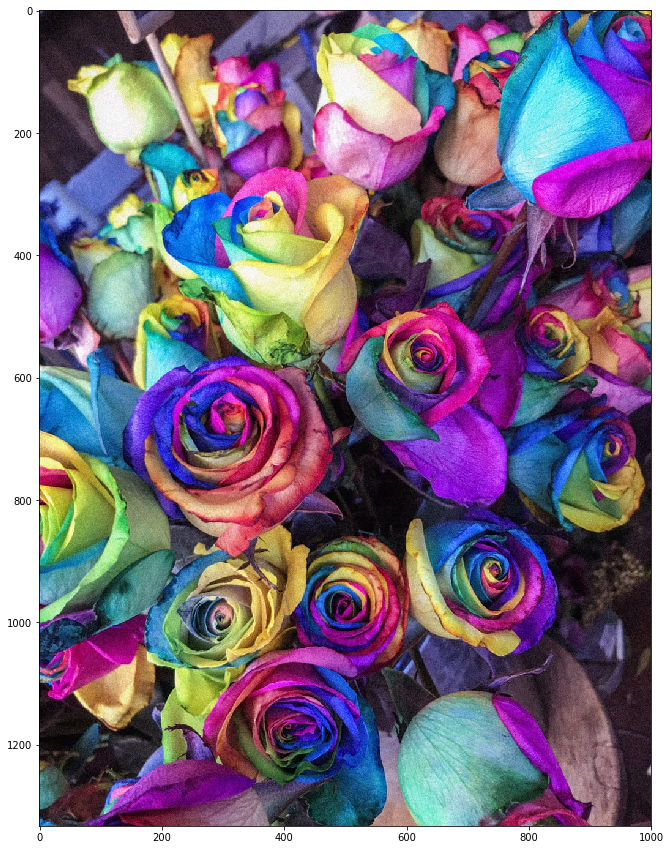

In [19]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

In [20]:
photo_data.shape

#print(photo_data)

(1333, 1000, 3)

The shape of the ndarray show that it is a three layered matrix. The first two numbers here are length and width, and the third number (i.e. 3) is for three layers: Red, Green and Blue.

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
RGB Color Mapping in the Photo:</p> <br>
<ul>
<li><p style="font-family: Arial; font-size:1.75em;color:red; font-style:bold">
RED pixel indicates Altitude</p>
<li><p style="font-family: Arial; font-size:1.75em;color:blue; font-style:bold">
BLUE pixel indicates Aspect
</p>
<li><p style="font-family: Arial; font-size:1.75em;color:green; font-style:bold">
GREEN pixel indicates Slope
</p>
</ul>
<br>
The higher values denote higher altitude, aspect and slope.


In [21]:
photo_data.size

3999000

In [22]:
photo_data.min(), photo_data.max()

(0, 255)

In [23]:
photo_data.mean()

104.98389647411852

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Pixel on the 150th Row and 250th Column</p>

In [24]:
photo_data[150, 250]

Array([234, 217, 111], dtype=uint8)

In [25]:
photo_data[150, 250, 1]

217

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Set a Pixel to All Zeros</p>
<br/>
We can set all three layer in a pixel as once by assigning zero globally to that (row,column) pairing. However, setting one pixel to zero is not noticeable.

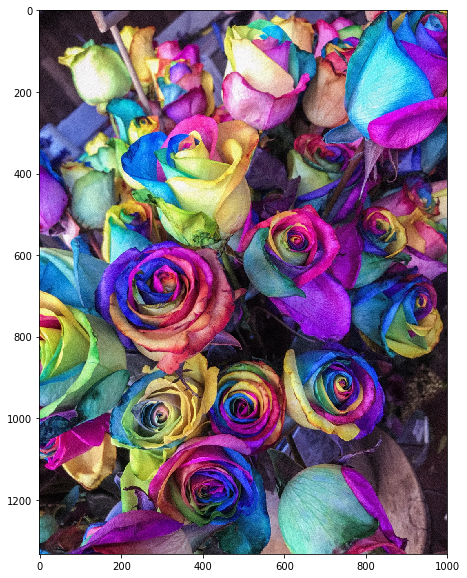

In [62]:
#photo_data = misc.imread('./wifire/sd-3layers.jpg')
photo_data[150, 250] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Changing Colors in a Range<p/>
<br/>
We can also use a range to change the pixel values. As an example, let's set the green layer for rows 200 t0 800 to full intensity.

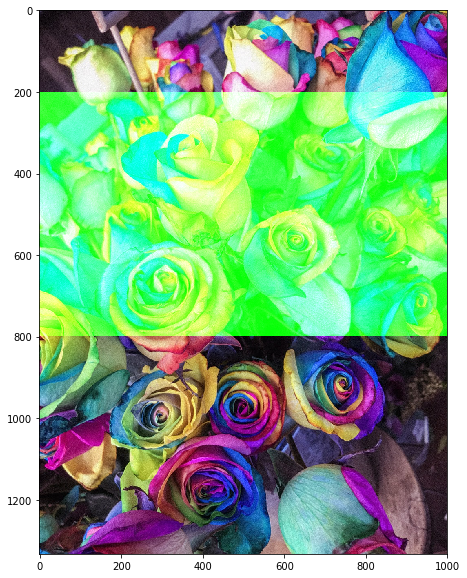

In [26]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")

photo_data[200:800, : ,1] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

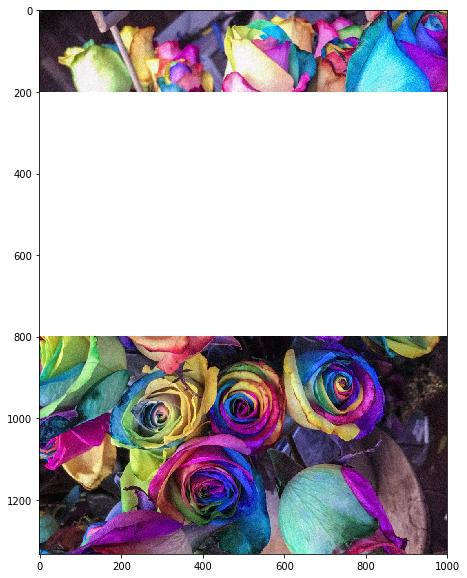

In [27]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")

photo_data[200:800, :] = 255
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

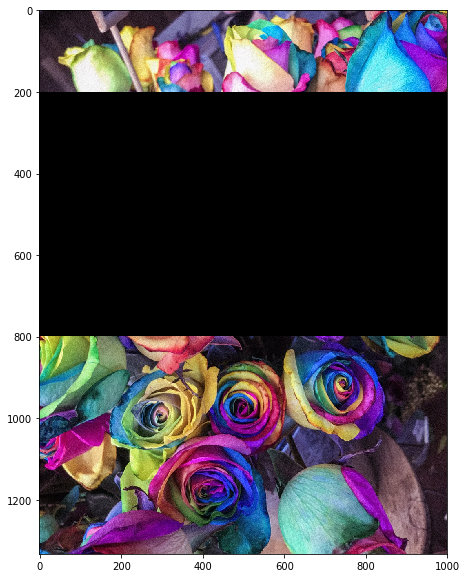

In [28]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")

photo_data[200:800, :] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Pick all Pixels with Low Values</p>

In [29]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
print("Shape of photo_data:", photo_data.shape)
low_value_filter = photo_data < 150
print("Shape of low_value_filter:", low_value_filter.shape)

Shape of photo_data: (1333, 1000, 3)
Shape of low_value_filter: (1333, 1000, 3)


<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Filtering Out Low Values</p><br/>
Whenever the low_value_filter is True, set value to 0.

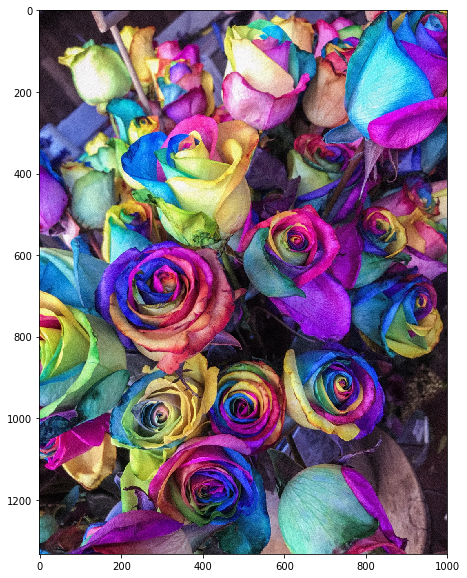

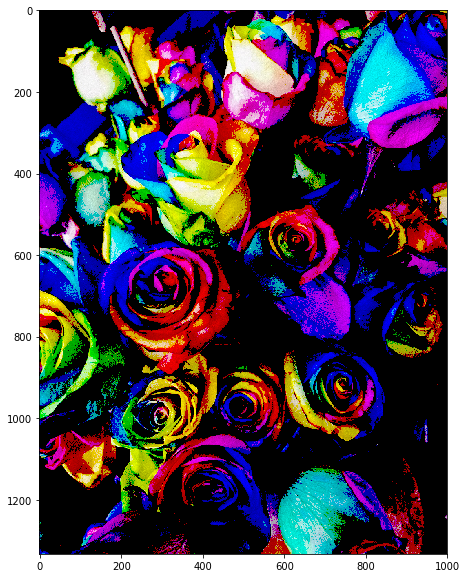

In [30]:
# import random
plt.figure(figsize=(10,10))
plt.imshow(photo_data)
photo_data[low_value_filter] = 0
plt.figure(figsize=(10,10))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
More Row and Column Operations</p><br>
You can design complex patters by making cols a function of rows or vice-versa. Here we try a linear relationship between rows and columns.

In [49]:
#rows_range = np.arange(len(photo_data))
cols_range = np.arange(photo_data.shape[1])
rows_range=cols_range
print(type(rows_range))

<class 'numpy.ndarray'>


In [50]:
photo_data[rows_range, cols_range] = 255

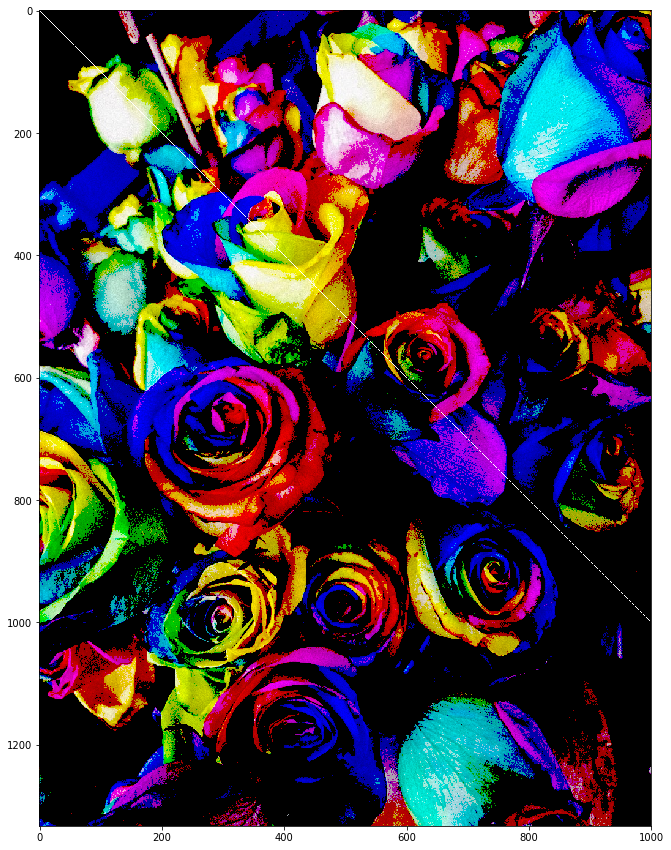

In [51]:
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Masking Images</p>
<br>Now I am trying a mask that is in shape of a circular disc.

In [52]:
total_rows, total_cols, total_layers = photo_data.shape
#print("photo_data = ", photo_data.shape)

X, Y = np.ogrid[:total_rows, :total_cols]
#print("X = ", X.shape, " and Y = ", Y.shape)

In [53]:
center_row, center_col = total_rows / 2, total_cols / 2
#print("center_row = ", center_row, "AND center_col = ", center_col)
#print(X - center_row)
#print(Y - center_col)
dist_from_center = (X - center_row)**2 + (Y - center_col)**2
#print(dist_from_center)
radius = (total_rows / 2)**2
#print("Radius = ", radius)
circular_mask = (dist_from_center > radius)
#print(circular_mask)
print(circular_mask[1500:1700,2000:2200])

[]


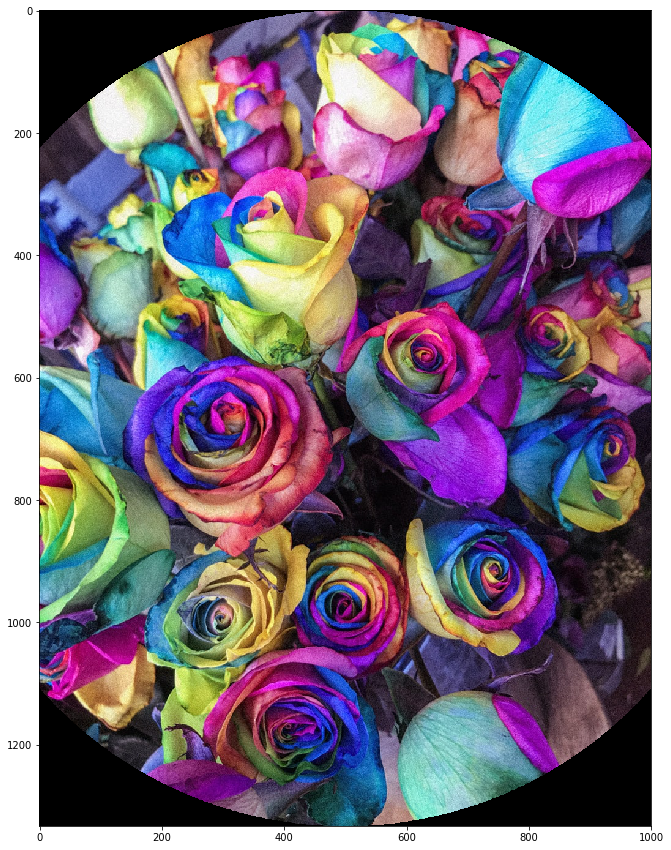

In [54]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
photo_data[circular_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Further Masking</p>
<br/>You can further improve the mask. For example, just get the upper half of the disc.

In [55]:
X, Y = np.ogrid[:total_rows, :total_cols]
half_upper = X < center_row # this line generates a mask for all rows above the center

half_upper_mask = np.logical_and(half_upper, circular_mask)

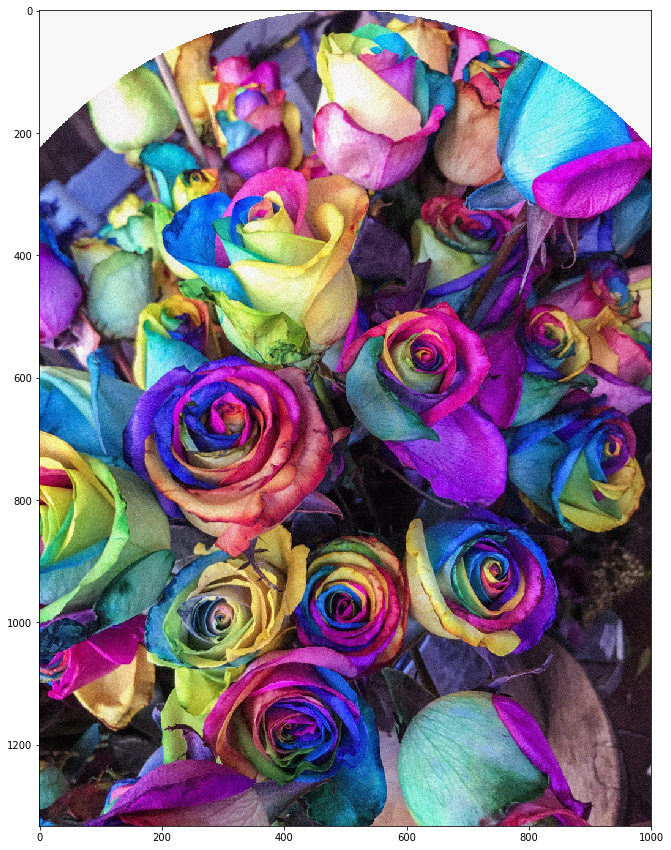

In [56]:
import random
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
#photo_data[half_upper_mask] = 255
photo_data[half_upper_mask] = random.randint(200,255)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:2.75em;color:purple; font-style:bold"><br>
Further Processing of our Imagery </p>

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold">
Processing of RED Pixels</p>

Remember that red pixels tell us about the height. Let us try to highlight all the high altitude areas. We will do this by detecting high intensity RED Pixels and muting down other areas.

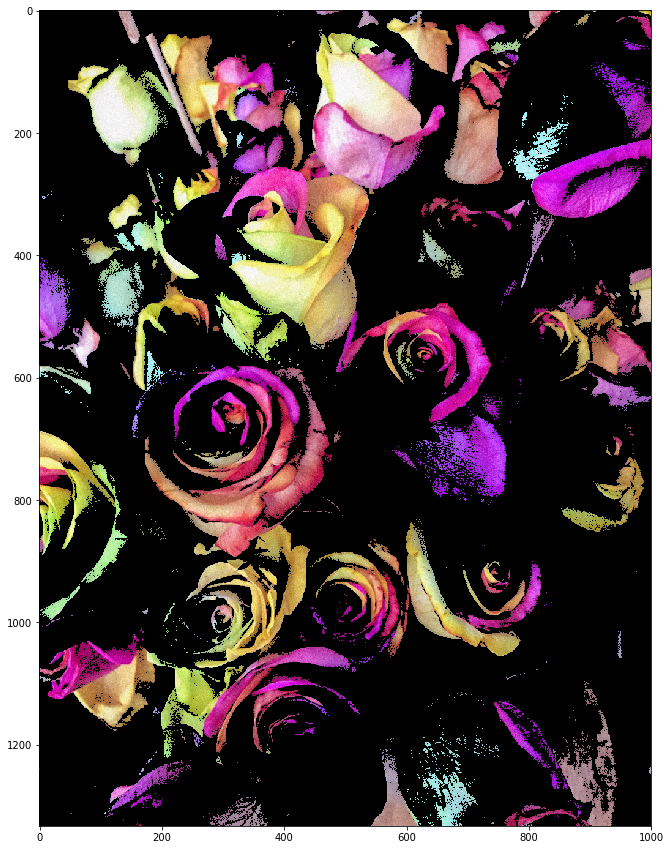

In [57]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
red_mask   = photo_data[:, : ,0] < 150

photo_data[red_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-GREEN Pixels</p>

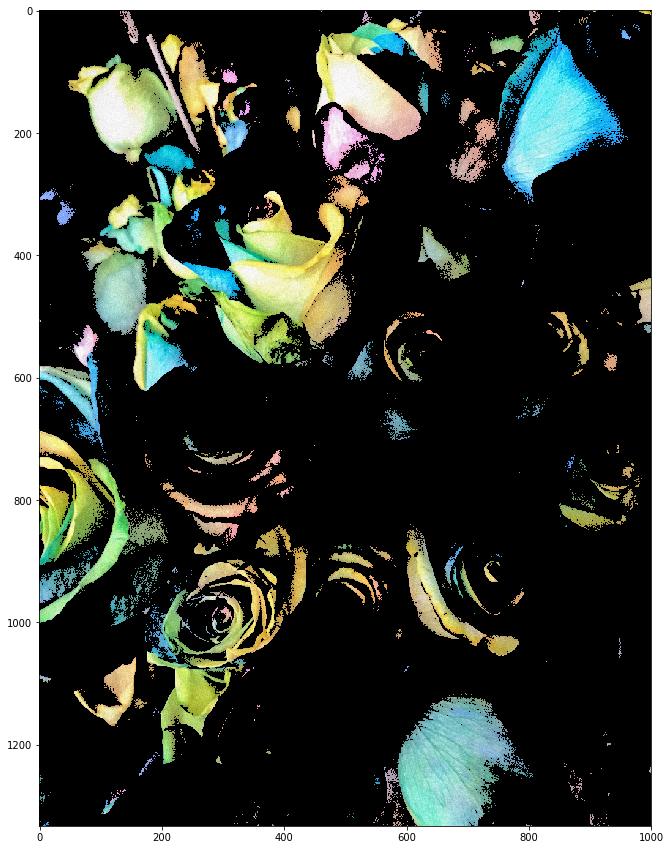

In [58]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
green_mask = photo_data[:, : ,1] < 150

photo_data[green_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>
Detecting Highly-BLUE Pixels</p>

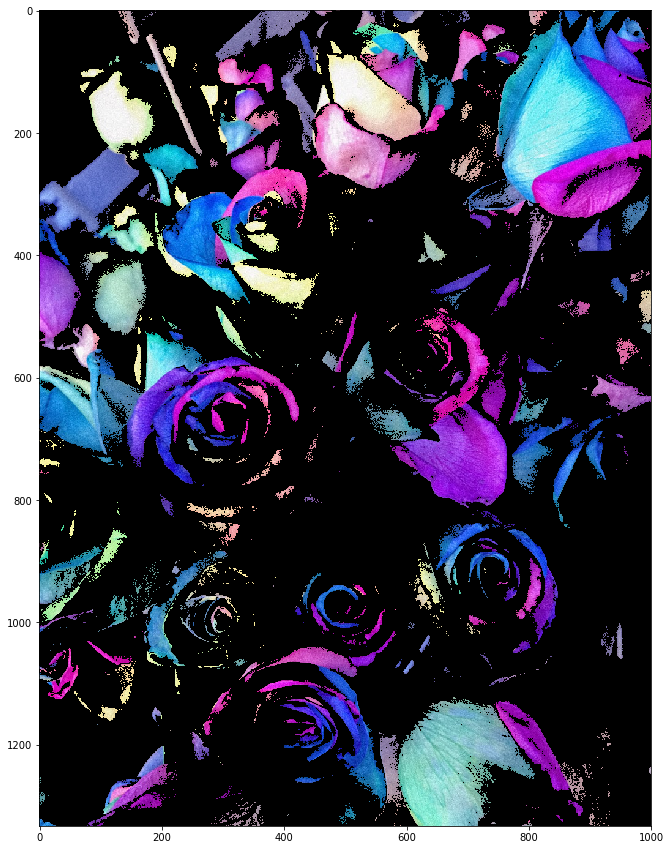

In [59]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")
blue_mask  = photo_data[:, : ,2] < 150

photo_data[blue_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

<p style="font-family: Arial; font-size:1.75em;color:#2462C0; font-style:bold"><br>

Composite mask that takes thresholds on all three layers: RED, GREEN, BLUE</p>

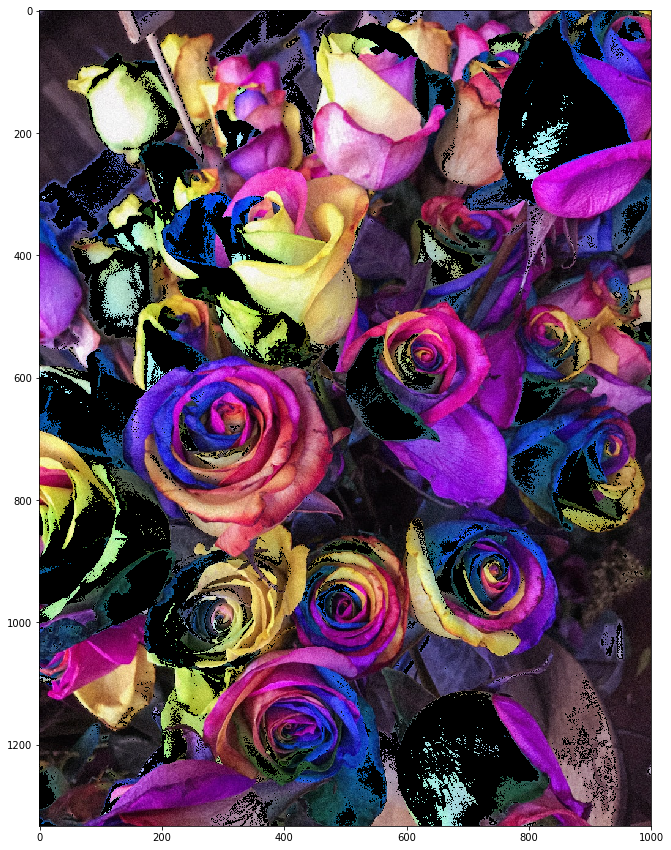

In [60]:
photo_data = imageio.imread("C:\\Users\\Lenovo\\Downloads\\prjct img.jpg")

red_mask   = photo_data[:, : ,0] < 150
green_mask = photo_data[:, : ,1] > 100
blue_mask  = photo_data[:, : ,2] < 100

final_mask = np.logical_and(red_mask, green_mask, blue_mask)
photo_data[final_mask] = 0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)